In [4]:
import torch
from argparse import Namespace

from datasets import DIV2K
from baseline import *

from utils import build_model, visualize

In [2]:
data_dir = input("Enter data directory: ")

vis_dataset = DIV2K(data_dir, train=True, visualize=True)

======>  Baseline Model: Interpolate  <======

======>  Baseline Model: VDSR  <======
PSNR: 27.442588806152344, SSIM: 0.8209403157234192

======>  Baseline Model: EDSR  <======
PSNR: 27.8336181640625, SSIM: 0.8239237666130066



c:\Users\ruix\anaconda3\Lib\site-packages\torchmetrics\utilities\prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


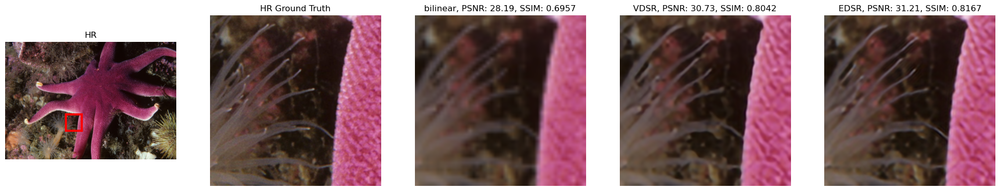

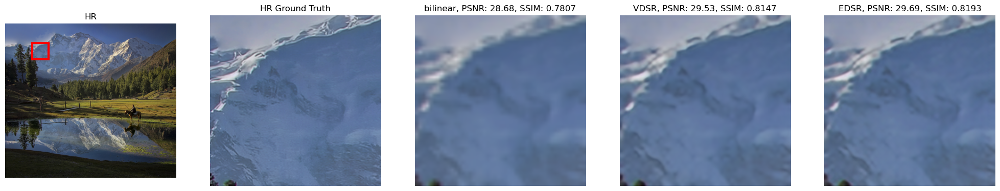

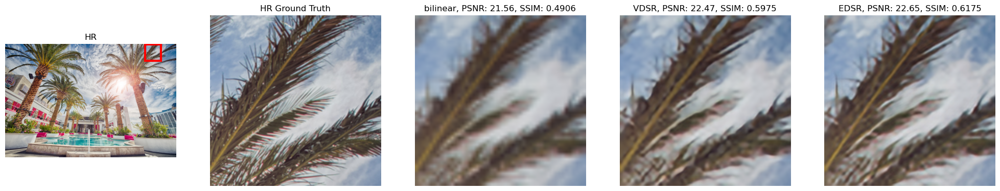

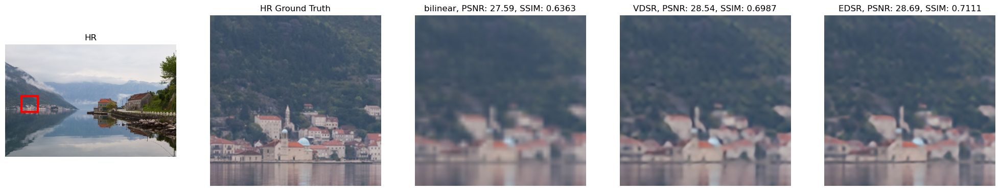

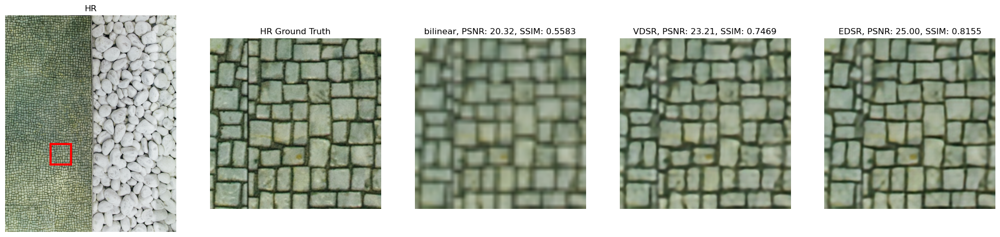

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


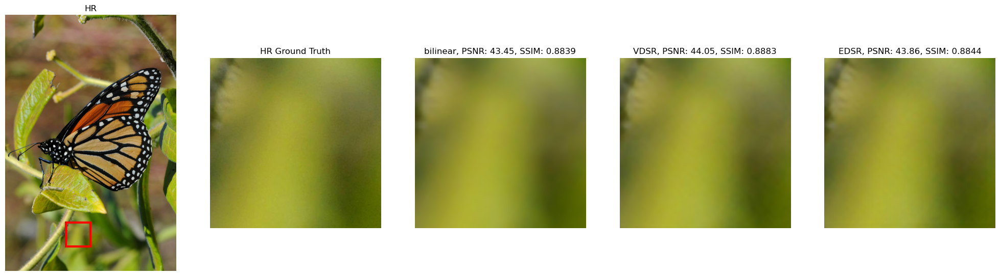

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


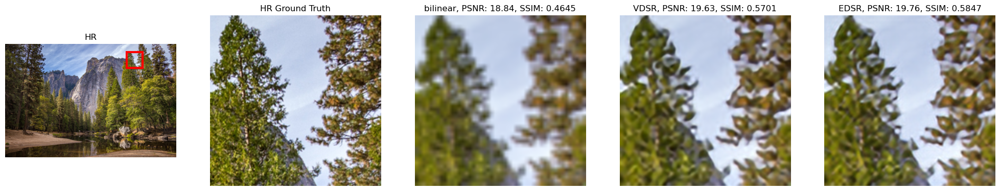

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


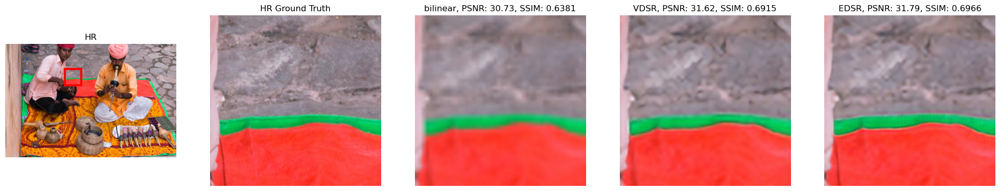

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


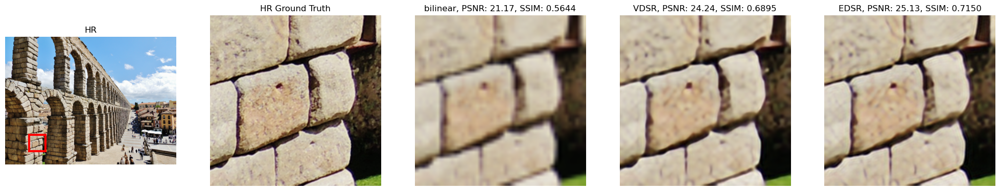

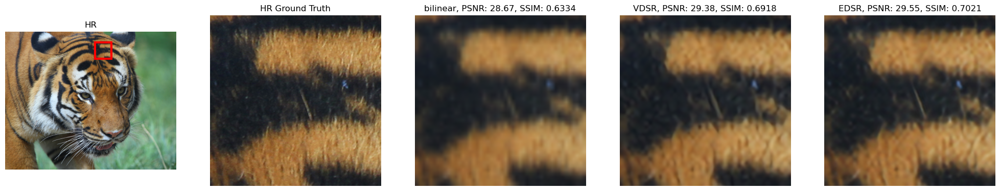

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


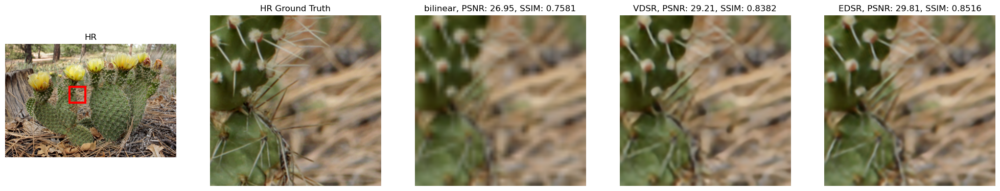

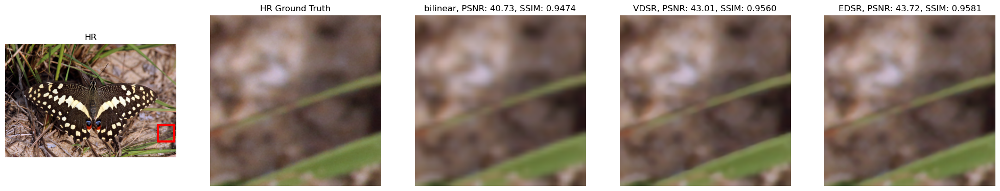

In [ ]:
model_names = ["Interpolate", 'FSRCNN', 'VDSR', 'ESPCN', 'IDN', 'EDSR', 'SRCNN']
model_ids = input(
    """
Select models to display (indices separated by spaces):
0: Interpolate
1: FSRCNN
2: VDSR
3: ESPCN
4: IDN
5: EDSR
6: SRCNN
    """).split()

models, used_names = [], []
for model_id in model_ids:
    model_id = int(model_id)
    model_name = model_names[model_id]
    
    model = build_model(Namespace(model=model_name))
    if model_id:
        state_dict = torch.load(f"logs/{model_name}/best_model.pth")
        model.load_state_dict(state_dict['model'])
        model.eval()

        print(f"PSNR: {state_dict['psnr']}, SSIM: {state_dict['ssim']}")
    
    models.append(model)
    used_names.append(model_name)

    print()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
visualize(vis_dataset, models, used_names, device, 12)